# Decision Tree Implementation

## Importing libraries

In [93]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import graphviz 
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn import tree
from sklearn.metrics import classification_report, confusion_matrix  
from sklearn.tree import DecisionTreeClassifier 
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier


## Importing Dataset

In [100]:
df=pd.read_csv("credit-card-default.csv")
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,defaulted
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0


## Data Analysis

In [95]:
len(df)

30000

In [96]:
df.shape

(30000, 25)

In [97]:
df.describe() 

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,defaulted
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,15000.500000,167484.322667,1.603733,1.853133,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,...,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,8660.398374,129747.661567,0.489129,0.790349,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,...,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,1.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,7500.750000,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,15000.500000,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,...,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,22500.250000,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,...,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,30000.000000,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,...,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


In [102]:
df.defaulted.value_counts()

0    23364
1     6636
Name: defaulted, dtype: int64

# df.corr()

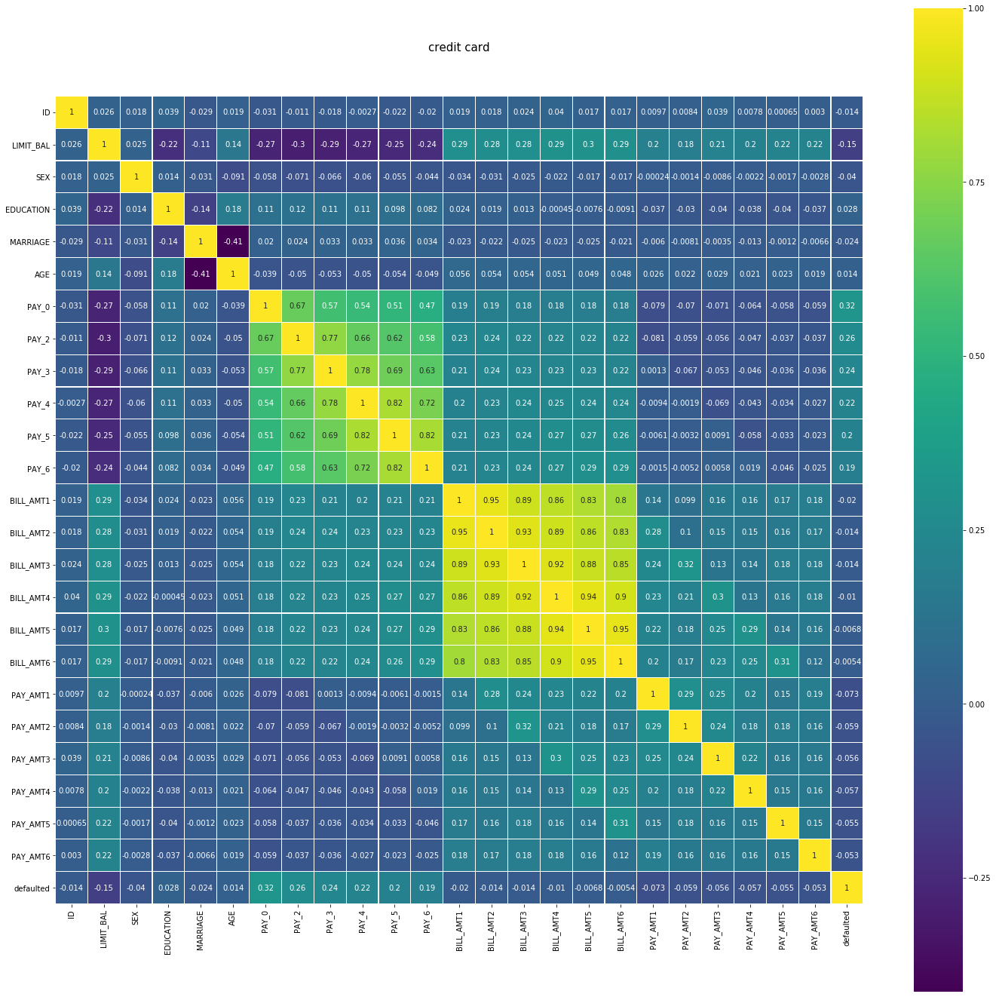

In [99]:
colormap = plt.cm.viridis
plt.figure(figsize=(24,24))
plt.title('credit card', y=1.05, size=15)
sns.heatmap(df.astype(float).corr(),linewidths=0.1,vmax=1.0, square=True, cmap=colormap, linecolor='white', annot=True)

## Preparing data

In [14]:
def entropy(probs):
    '''
    Takes a list of probabilities and calculates their entropy
    '''
    import math
    return sum( [-prob*math.log(prob, 2) for prob in probs] )
    

def entropy_of_list(a_list):
    '''
    Takes a list of items with discrete values (e.g., sex, Marriage)
    and returns the entropy for those items.
    '''
    from collections import Counter
    cnt = Counter(x for x in a_list)
    num_instances = len(a_list)*1.0
    probs = [x / num_instances for x in cnt.values()]
    return entropy(probs)
total_entropy = entropy_of_list(df['defaulted'])
print (total_entropy)

0.7623526222941667


In [16]:
shuffle_indices = np.random.permutation(len(df))
test_size = int(len(shuffle_indices)*0.3)
test_size

9000

In [17]:
test_indices =shuffle_indices[:test_size]
train_indices = shuffle_indices[test_size:]

In [19]:
test= df.iloc[test_indices]
train = df.iloc[train_indices]

In [21]:
classifier = DecisionTreeClassifier()  
classifier.fit(train.drop('defaulted',axis=1), train['defaulted'])  

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [22]:
pred = classifier.predict(test.drop('defaulted',axis=1)) 

In [23]:
print(confusion_matrix(test['defaulted'], pred))  

[[5643 1313]
 [1194  850]]


In [24]:
print(classification_report(test['defaulted'], pred))

             precision    recall  f1-score   support

          0       0.83      0.81      0.82      6956
          1       0.39      0.42      0.40      2044

avg / total       0.73      0.72      0.72      9000



In [35]:
accuracy_score(test['defaulted'], pred)

0.7214444444444444

In [60]:
clf = tree.DecisionTreeClassifier()
clf = clf.fit(train.drop('defaulted',axis=1), train['defaulted'])

In [62]:

 dot_data = tree.export_graphviz(clf, out_file=None) 
 graph = graphviz.Source(dot_data) 
 graph.render("credit-card-default") 

'credit-card-default.pdf'

In [66]:
dot_data = tree.export_graphviz(clf, out_file=None,feature_names=['ID','LIMIT_BAL','SEX','EDUCATION','MARRIAGE','AGE','PAY_0','PAY_2','PAY_3','PAY_4','PAY_5','PAY_6','BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6','PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6'],class_names=['0','1'],filled=True, rounded=True,special_characters=True)  
graph = graphviz.Source(dot_data)  
graph 

In [38]:

clf_gini = DecisionTreeClassifier(criterion = "gini", random_state = 100,
                               max_depth=3, min_samples_leaf=5)
clf_gini.fit(train.drop('defaulted',axis=1), train['defaulted'])

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=3,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=5, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best')

In [28]:
clf_entropy = DecisionTreeClassifier(criterion = "entropy", random_state = 100,
 max_depth=3, min_samples_leaf=5)
clf_entropy.fit(train.drop('defaulted',axis=1), train['defaulted'])

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=3,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=5, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best')

In [29]:
y_pred = clf_gini.predict(test.drop('defaulted',axis=1))
y_pred

array([0, 1, 0, ..., 0, 0, 0])

In [30]:
print(confusion_matrix(test['defaulted'], pred))  

[[5643 1313]
 [1194  850]]


In [31]:
print(classification_report(test['defaulted'], pred))

             precision    recall  f1-score   support

          0       0.83      0.81      0.82      6956
          1       0.39      0.42      0.40      2044

avg / total       0.73      0.72      0.72      9000



In [34]:
accuracy_score(test['defaulted'], y_pred)

0.8167777777777778

In [75]:
precision_score(test['defaulted'],y_pred)

0.6704055220017257

## Bagging

In [76]:
clf_bag = BaggingClassifier(DecisionTreeClassifier(), bootstrap_features = 'true', warm_start = 'true', n_estimators=15)

In [77]:
clf_bag.fit(train.drop('defaulted',axis=1),train['defaulted'])

BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
         bootstrap=True, bootstrap_features='true', max_features=1.0,
         max_samples=1.0, n_estimators=15, n_jobs=1, oob_score=False,
         random_state=None, verbose=0, warm_start='true')

In [78]:
prediction_bag = clf_bag.predict(test.drop('defaulted',axis=1))

In [79]:
accuracy_score(test['defaulted'],prediction_bag)

0.7937777777777778

In [81]:
precision_score(test['defaulted'],prediction_bag)

0.5851449275362319

## Random Forest

In [82]:
rf = RandomForestClassifier(max_depth = 20,random_state=0)
rf.fit(train.drop('defaulted',axis=1),train['defaulted'])

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=20, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=0, verbose=0, warm_start=False)

In [84]:
pred_rf = rf.predict(test.drop('defaulted',axis=1))


In [85]:
accuracy_score(test['defaulted'],pred_rf)

0.8021111111111111

In [86]:
precision_score(test['defaulted'],pred_rf)

0.6209751609935602

##  Boosting

In [87]:
boost = GradientBoostingClassifier()
boost.fit(train.drop('defaulted',axis=1),train['defaulted'])

GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              presort='auto', random_state=None, subsample=1.0, verbose=0,
              warm_start=False)

In [91]:
pred_boost = boost.predict(test.drop('defaulted',axis=1))


In [90]:
accuracy_score(test['defaulted'],pred_boost)

0.8181111111111111

In [92]:
precision_score(test['defaulted'],pred_rf)

0.6209751609935602